# Analysis of COVID-19( SARS-CoV-2 ) Cases Trend and Vaccination Status in India using Data Science Tools like NumPy, Pandas, Matplotlib, Plotly Express & Seaborn along with Data Analysis and Visualization

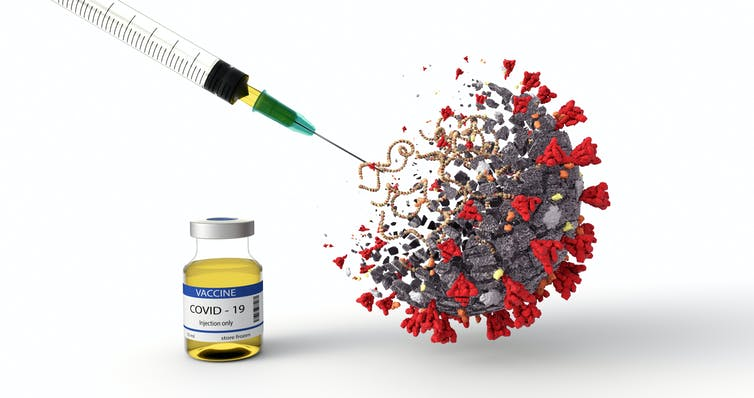

The objective of this project is to get hands on with COVID-19 Dataset which includes stats for cases of COVID and Vaccination in India including data of all the three vaccines. By using the dataset, I've analysed, cleaned, summarized, manipulated and visualised the dataset so that the trend of cases and progress of COVID vaccination can be understand and visualised in graphical way. This is an insight of how actual dashboard data that we see on Govt. of India MoHFW website and interpret the stats are manipulated and presented.

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

In [2]:
# Importing datasets of Govt. of India COVID-19 CSV API
cases = pd.read_csv('states.csv')
vaccine_state = pd.read_csv('cowin_vaccine_data_statewise.csv')
vaccine_india = pd.read_csv('cowin_vaccine_data_india.csv')

# Removing Null Values from Dataset

In [3]:
# Checking for null values (anomalies)
cases.isnull().sum()

Date         0
State        0
Confirmed    0
Recovered    0
Deceased     0
Other        0
dtype: int64

In [4]:
vaccinated.isnull().sum() 

Updated On                             0
State                                  0
Total Doses Administered             108
First Dose Administered              108
Second Dose Administered             108
Male (Doses Administered)            108
Female (Doses Administered)          108
Transgender (Doses Administered)     108
Covaxin (Doses Administered)         108
CoviShield (Doses Administered)      108
Sputnik V (Doses Administered)      4609
dtype: int64

In [6]:
vaccine_india.isnull().sum() 

Updated On                              8211
State                                   8211
Total Doses Administered                8211
First Dose Administered                 8211
Second Dose Administered                8211
Male (Doses Administered)               8371
Female (Doses Administered)             8371
Transgender (Doses Administered)        8371
Covaxin (Doses Administered)            8211
CoviShield (Doses Administered)         8211
Sputnik V (Doses Administered)          8336
Male (Individuals Vaccinated)           8276
Female (Individuals Vaccinated)         8276
Transgender (Individuals Vaccinated)    8276
dtype: int64

# Analysing and Visualising COVID-19 Cases from the beginning of pandemic to till date

In [7]:
# Analysing first few rows of Cases data
cases.drop(cases.index[(cases["State"] == "India")], axis=0, inplace=True)
cases["Active"] = cases["Confirmed"] - (cases["Recovered"] + cases["Deceased"] + cases["Other"])
cases.head(10)

,Date,State,Confirmed,Recovered,Deceased,Other,Active
0,30-01-2020,Kerala,1,0,0,0,1
2,02-02-2020,Kerala,2,0,0,0,2
4,03-02-2020,Kerala,3,0,0,0,3
6,14-02-2020,Kerala,3,3,0,0,0
8,02-03-2020,Delhi,1,0,0,0,1
9,02-03-2020,Kerala,3,3,0,0,0
10,02-03-2020,Telangana,1,0,0,0,1
12,03-03-2020,Delhi,1,0,0,0,1
13,03-03-2020,Kerala,3,3,0,0,0
14,03-03-2020,Rajasthan,1,0,0,0,1


In [8]:
cases.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18794 entries, 0 to 19343
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Date       18794 non-null  object
 1   State      18794 non-null  object
 2   Confirmed  18794 non-null  int64 
 3   Recovered  18794 non-null  int64 
 4   Deceased   18794 non-null  int64 
 5   Other      18794 non-null  int64 
 6   Active     18794 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 1.1+ MB


In [9]:
cases.describe()

,Confirmed,Recovered,Deceased,Other,Active
count,1.879400e+04,1.879400e+04,18794.000000,18794.000000,18794.000000
mean,3.228073e+05,3.003672e+05,4344.539055,118.794935,17976.725764
std,6.986799e+05,6.587054e+05,11675.595673,570.894333,52152.944884
min,0.000000e+00,0.000000e+00,0.000000,-1.000000,-3.000000
25%,4.729250e+03,3.562250e+03,39.000000,0.000000,312.000000
50%,4.588500e+04,3.766350e+04,644.000000,0.000000,2184.000000
75%,3.172280e+05,2.986118e+05,3846.750000,1.000000,11991.750000
max,6.456939e+06,6.263416e+06,137157.000000,6052.000000,699858.000000


AxesSubplot(0.125,0.125;0.775x0.755)


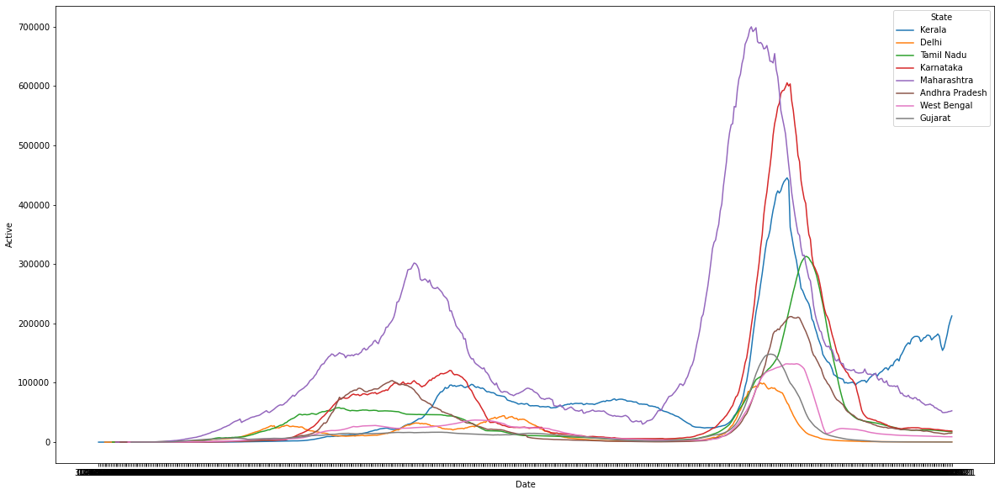

In [10]:
# Visualizing Active Cases of Most Affected States till 2nd wave
plt.figure(figsize = (20, 10))
gp = sns.lineplot(x = cases['Date'], y = cases['Active'], data = cases[cases['State'].isin(['Maharashtra','Andhra Pradesh','Delhi','Kerala','Tamil Nadu','Karnataka','Gujarat','West Bengal'])], hue = 'State')
print(gp)

<Figure size 1080x576 with 0 Axes>

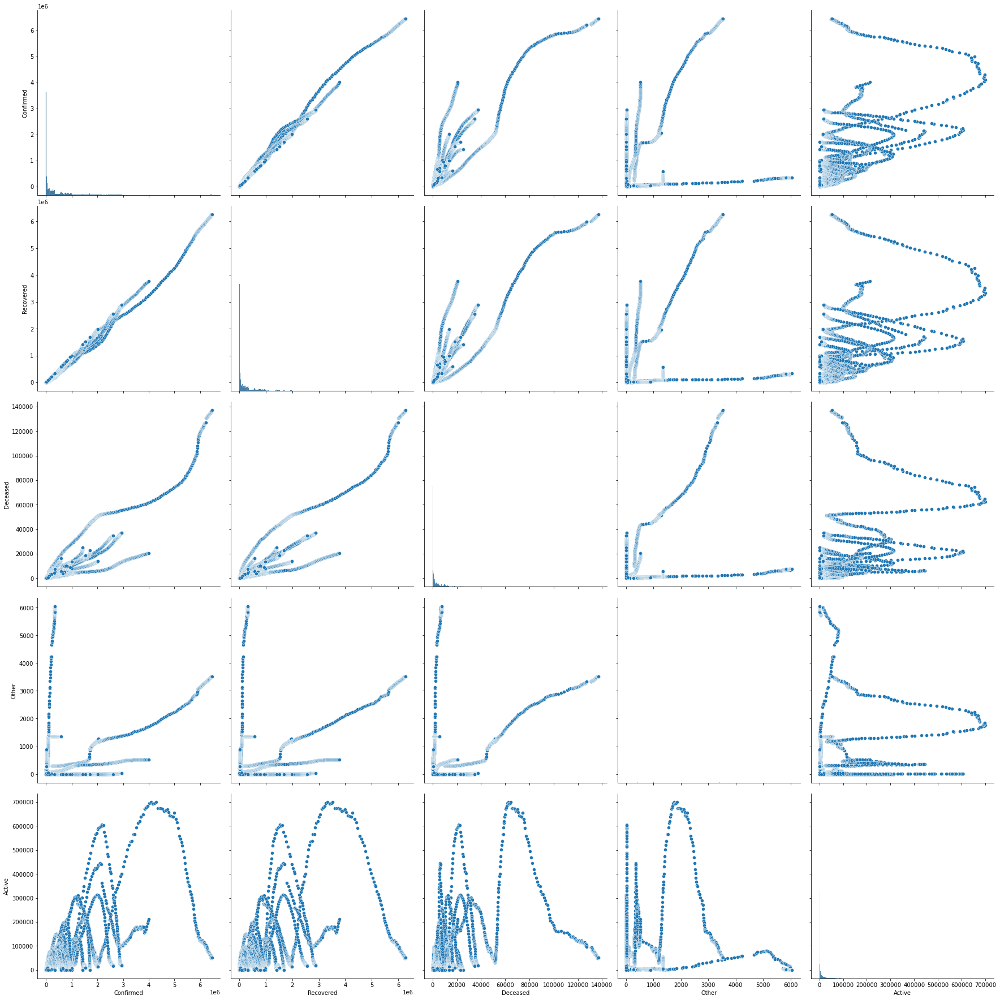

In [12]:
# Visulasizing Relation between every columns of the dataset
plt.figure(figsize=(15,8))
pair = sns.pairplot(cases, height = 5)
plt.show()

# Visualization of Cases during 2nd Wave of COVID-19 Pandemic

In [11]:
fig = px.bar(cases, x='Date', y='Active', range_x=['2021-01-01','2021-08-28'])
fig.show()

# Exploratory Data Analysis on COVID-19 Vaccination Progress

In [3]:
vaccine_state.head(5)

,Updated On,State,Total Doses Administered,First Dose Administered,Second Dose Administered,Male (Doses Administered),Female (Doses Administered),Transgender (Doses Administered),Covaxin (Doses Administered),CoviShield (Doses Administered),Sputnik V (Doses Administered)
0,16-01-2021,Andaman and Nicobar Islands,23.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN
1,17-01-2021,Andaman and Nicobar Islands,23.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN
2,18-01-2021,Andaman and Nicobar Islands,42.0,42.0,0.0,29.0,13.0,0.0,0.0,42.0,NaN
3,19-01-2021,Andaman and Nicobar Islands,89.0,89.0,0.0,53.0,36.0,0.0,0.0,89.0,NaN
4,20-01-2021,Andaman and Nicobar Islands,124.0,124.0,0.0,67.0,57.0,0.0,0.0,124.0,NaN


In [4]:
vaccine_india.head(5)

,Updated On,State,Total Doses Administered,First Dose Administered,Second Dose Administered,Male (Doses Administered),Female (Doses Administered),Transgender (Doses Administered),Covaxin (Doses Administered),CoviShield (Doses Administered),Sputnik V (Doses Administered),Male (Individuals Vaccinated),Female (Individuals Vaccinated),Transgender (Individuals Vaccinated)
0,16-01-2021,India,48276.0,48276.0,0.0,NaN,NaN,NaN,579.0,47697.0,NaN,23757.0,24517.0,2.0
1,17-01-2021,India,58604.0,58604.0,0.0,NaN,NaN,NaN,635.0,57969.0,NaN,27348.0,31252.0,4.0
2,18-01-2021,India,99449.0,99449.0,0.0,NaN,NaN,NaN,1299.0,98150.0,NaN,41361.0,58083.0,5.0
3,19-01-2021,India,195525.0,195525.0,0.0,NaN,NaN,NaN,3017.0,192508.0,NaN,81901.0,113613.0,11.0
4,20-01-2021,India,251280.0,251280.0,0.0,NaN,NaN,NaN,3946.0,247334.0,NaN,98111.0,153145.0,24.0


In [5]:
vaccine_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8208 entries, 0 to 8207
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Updated On                        8208 non-null   object 
 1   State                             8208 non-null   object 
 2   Total Doses Administered          8100 non-null   float64
 3   First Dose Administered           8100 non-null   float64
 4   Second Dose Administered          8100 non-null   float64
 5   Male (Doses Administered)         8100 non-null   float64
 6   Female (Doses Administered)       8100 non-null   float64
 7   Transgender (Doses Administered)  8100 non-null   float64
 8   Covaxin (Doses Administered)      8100 non-null   float64
 9   CoviShield (Doses Administered)   8100 non-null   float64
 10  Sputnik V (Doses Administered)    3599 non-null   float64
dtypes: float64(9), object(2)
memory usage: 705.5+ KB


In [6]:
vaccine_india.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8436 entries, 0 to 8435
Data columns (total 14 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Updated On                            225 non-null    object 
 1   State                                 225 non-null    object 
 2   Total Doses Administered              225 non-null    float64
 3   First Dose Administered               225 non-null    float64
 4   Second Dose Administered              225 non-null    float64
 5   Male (Doses Administered)             65 non-null     float64
 6   Female (Doses Administered)           65 non-null     float64
 7   Transgender (Doses Administered)      65 non-null     float64
 8   Covaxin (Doses Administered)          225 non-null    float64
 9   CoviShield (Doses Administered)       225 non-null    float64
 10  Sputnik V (Doses Administered)        100 non-null    float64
 11  Male (Individuals

In [7]:
vaccine_state.State.unique()

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Dadra and Nagar Haveli and Daman and Diu',
       'Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh',
       'Jammu and Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh',
       'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry',
       'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telangana',
       'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'],
      dtype=object)

In [8]:
vaccine_state.rename(columns={'Updated On':'Date','Total Individuals Vaccinated':'Total_Individuals_Vaccinated','Total Sessions Conducted':'Total_Sessions_Conducted',
                           'First Dose Administered':'First_Dose_Administered','Second Dose Administered':'Second_Dose_Administered',
                           'Male (Doses Administered)':'Male','Female (Doses Administered)':'Female',
                           'Transgender (Doses Administered)':'ThirdGender','Covaxin (Doses Administered)':'Covaxin_Doses',
                           'CoviShield (Doses Administered)':'Covishield_Doses','Sputnik V (Doses Administered)':'Sputnik_V_Doses',
                           'Total Doses Administered':'Total_Doses_Administered'}, inplace=True)
vaccine_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8208 entries, 0 to 8207
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8208 non-null   object 
 1   State                     8208 non-null   object 
 2   Total_Doses_Administered  8100 non-null   float64
 3   First_Dose_Administered   8100 non-null   float64
 4   Second_Dose_Administered  8100 non-null   float64
 5   Male                      8100 non-null   float64
 6   Female                    8100 non-null   float64
 7   ThirdGender               8100 non-null   float64
 8   Covaxin_Doses             8100 non-null   float64
 9   Covishield_Doses          8100 non-null   float64
 10  Sputnik_V_Doses           3599 non-null   float64
dtypes: float64(9), object(2)
memory usage: 705.5+ KB


In [9]:
# Renaming columns of DataFrame
vaccine_india.rename(columns={'Updated On':'Date','Total Individuals Vaccinated':'Total_Individuals_Vaccinated','Total Sessions Conducted':'Total_Sessions_Conducted',
                           'First Dose Administered':'First_Dose_Administered','Second Dose Administered':'Second_Dose_Administered',
                           'Male (Doses Administered)':'Male','Female (Doses Administered)':'Female',
                           'Transgender (Doses Administered)':'ThirdGender','Covaxin (Doses Administered)':'Covaxin_Doses',
                           'CoviShield (Doses Administered)':'Covishield_Doses','Sputnik V (Doses Administered)':'Sputnik_V_Doses',
                           'Male (Individuals Vaccinated)':'Male_Vaccinated', 'Female (Individuals Vaccinated)':'Female_Vaccinated',
                           'Transgender (Individuals Vaccinated)':'Thirdgender_Vaccinated', 'Total Doses Administered':'Total_Doses_Administered'}, inplace=True)
vaccine_india.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8436 entries, 0 to 8435
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      225 non-null    object 
 1   State                     225 non-null    object 
 2   Total_Doses_Administered  225 non-null    float64
 3   First_Dose_Administered   225 non-null    float64
 4   Second_Dose_Administered  225 non-null    float64
 5   Male                      65 non-null     float64
 6   Female                    65 non-null     float64
 7   ThirdGender               65 non-null     float64
 8   Covaxin_Doses             225 non-null    float64
 9   Covishield_Doses          225 non-null    float64
 10  Sputnik_V_Doses           100 non-null    float64
 11  Male_Vaccinated           160 non-null    float64
 12  Female_Vaccinated         160 non-null    float64
 13  Thirdgender_Vaccinated    160 non-null    float64
dtypes: float

In [10]:
vaccine_india.head()

,Date,State,Total_Doses_Administered,First_Dose_Administered,Second_Dose_Administered,Male,Female,ThirdGender,Covaxin_Doses,Covishield_Doses,Sputnik_V_Doses,Male_Vaccinated,Female_Vaccinated,Thirdgender_Vaccinated
0,16-01-2021,India,48276.0,48276.0,0.0,NaN,NaN,NaN,579.0,47697.0,NaN,23757.0,24517.0,2.0
1,17-01-2021,India,58604.0,58604.0,0.0,NaN,NaN,NaN,635.0,57969.0,NaN,27348.0,31252.0,4.0
2,18-01-2021,India,99449.0,99449.0,0.0,NaN,NaN,NaN,1299.0,98150.0,NaN,41361.0,58083.0,5.0
3,19-01-2021,India,195525.0,195525.0,0.0,NaN,NaN,NaN,3017.0,192508.0,NaN,81901.0,113613.0,11.0
4,20-01-2021,India,251280.0,251280.0,0.0,NaN,NaN,NaN,3946.0,247334.0,NaN,98111.0,153145.0,24.0


In [11]:
vaccine_state.head()

,Date,State,Total_Doses_Administered,First_Dose_Administered,Second_Dose_Administered,Male,Female,ThirdGender,Covaxin_Doses,Covishield_Doses,Sputnik_V_Doses
0,16-01-2021,Andaman and Nicobar Islands,23.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN
1,17-01-2021,Andaman and Nicobar Islands,23.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN
2,18-01-2021,Andaman and Nicobar Islands,42.0,42.0,0.0,29.0,13.0,0.0,0.0,42.0,NaN
3,19-01-2021,Andaman and Nicobar Islands,89.0,89.0,0.0,53.0,36.0,0.0,0.0,89.0,NaN
4,20-01-2021,Andaman and Nicobar Islands,124.0,124.0,0.0,67.0,57.0,0.0,0.0,124.0,NaN


# Removing Null Data Values from Dataset

In [13]:
vaccine_state.dropna(inplace=True)

# Trends Visualization using Plotly Express

In [14]:
# Visualizing Vaccination Trend in India
fig = px.bar(vaccine_india, x='Date', y='Total_Doses_Administered', range_x=['2021-01-16','2021-08-28'])
fig.show()

In [15]:
# Visualizing no. of COVISHIELD doses administered
px.bar(vaccine_state, x='State', y='Covishield_Doses', title='Covishield Doses Trend')

In [16]:
# Visualizing no. of COVAXIN doses administered
px.bar(vaccine_state, x='State', y='Covaxin_Doses', title='Covaxin Doses Trend')

In [17]:
# Visualizing no. of SPUTNIK V doses administered
px.bar(vaccine_state, x='State', y='Sputnik_V_Doses', title='Sputnik V Doses Trend')

In [18]:
covishield = vaccine_india.Covishield_Doses.max()
covaxin = vaccine_india.Covaxin_Doses.max()
sputnik = vaccine_india.Sputnik_V_Doses.max()
print("Max Covishield Dose = ",covishield)
print("Max Covaxin Dose = ",covaxin)
print("Max Sputnik V Dose = ",sputnik)

Max Covishield Dose =  549280691.0
Max Covaxin Dose =  76367079.0
Max Sputnik V Dose =  735154.0


In [19]:
# Vaccine dataset manipulation and finding relations and trends between relevant columns 
visual = vaccine_state.copy()
visual.drop({'State','First_Dose_Administered','Second_Dose_Administered','Date','Male','Female','ThirdGender','Total_Doses_Administered'}, axis=1, inplace=True)
visual.head()

,Covaxin_Doses,Covishield_Doses,Sputnik_V_Doses
125,0.0,117950.0,0.0
126,0.0,118761.0,0.0
127,0.0,119144.0,0.0
128,0.0,119595.0,0.0
129,0.0,120282.0,0.0


<Figure size 2880x2160 with 0 Axes>

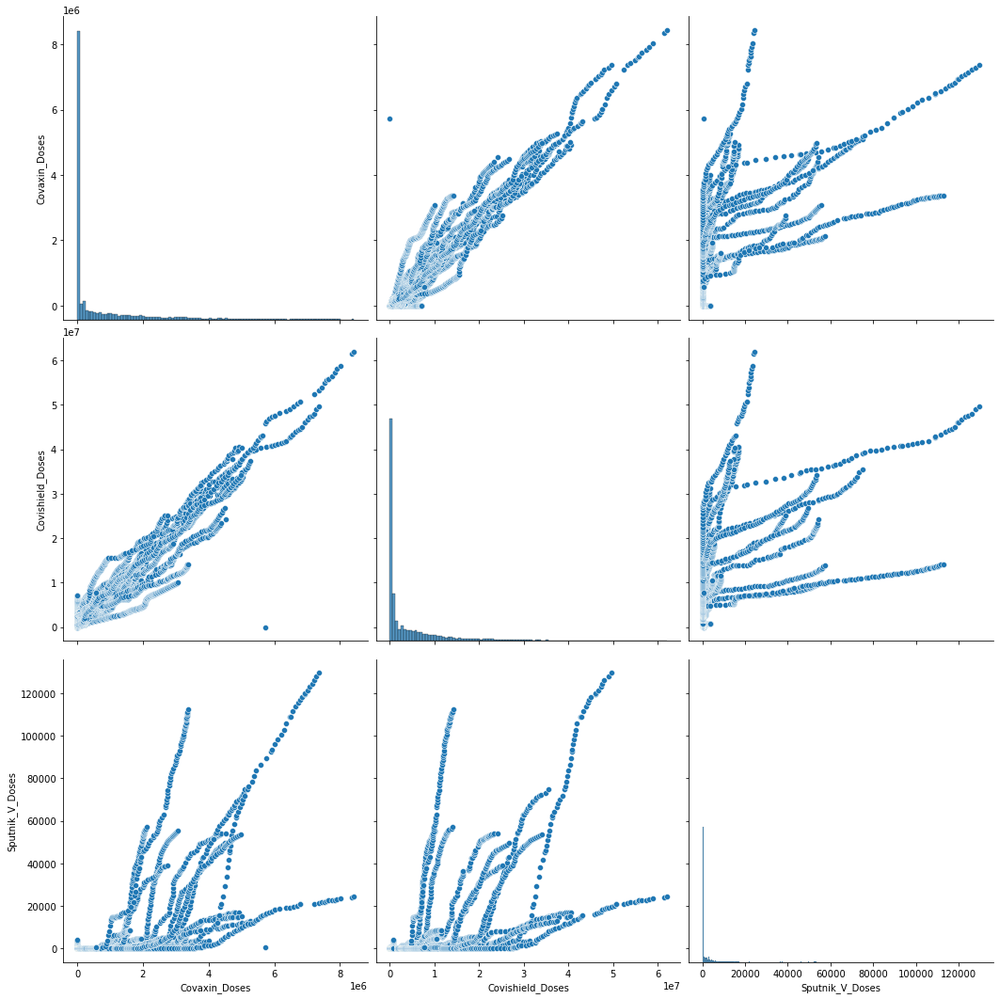

In [66]:
# Visulasizing Relation between every columns of the dataset
plt.figure(figsize=(40,30))
pair = sns.pairplot(visual, height = 5)
plt.show()

In [20]:
fig = px.bar(vaccine_state, x='State', y='Total_Doses_Administered', title='Vaccination Progress in India')
fig.show()

# Vaccination Progress Curves

In [22]:
# First Dose Progress Curve
fig = px.histogram(vaccine_india, x='Date', y='First_Dose_Administered', histfunc="avg", title="Daily Average Dosage Rate")
fig.show()

In [23]:
# Second Dose Progress Curve
fig = px.histogram(vaccine_india, x='Date', y='Second_Dose_Administered', histfunc="avg", title="Daily Average Dosage Rate")
fig.show()

In [24]:
fig = px.pie(vaccine_state, values='Total_Doses_Administered', names='State')
fig.show()

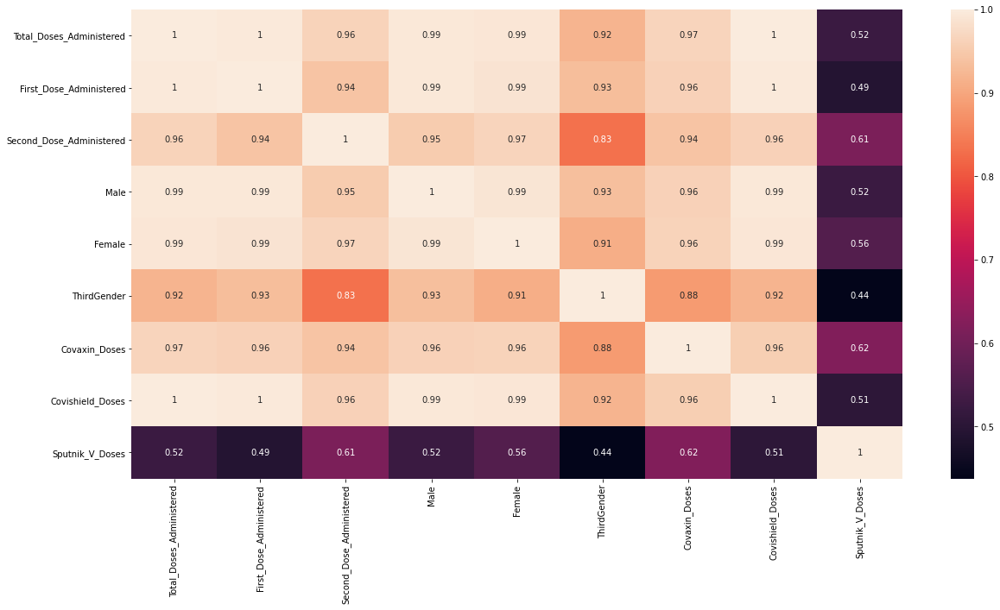

In [25]:
plt.figure(figsize=(20,10))
sns.heatmap(vaccine_state.corr(), annot=True)
plt.show()

# Conclusions from the analysis:

-> The rise in no. of active cases of COVID were double in 2nd wave than that of the peak of 1st wave.

-> The most affected states were Maharashtra and U.P.

-> The peak of cases in 1st wave was in September 2020 and in 2nd wave was in May 2021.

-> The rate of vaccination in India is linear.

-> Covishield is the most administered vaccine followed by Covaxin and recently Sputnik V.

This project is done for Data Analysis of COVID-19 Cases and Vaccination Progress using Data Science Tools and Concepts.
Data Cleaning, Summarizing, Exploratory Data Analysis and Visualization has been done on COVID-19 Cases and Vaccination with dataset obtained from Govt. of India API Website. 

Dataset Source :  api.covid19india.org

© 2021 Swarnendu Sekhar Das